In [1]:
import plotly.express as px

In [2]:
import numpy as np
import pandas as pd


In [3]:
covid_data = pd.read_csv('E:/Coding Practice/datathon/Datathon-Northeastern-2020-Abdul-Yashvin-Rishabh/EDA Trials/RDSC-07-30-Update/RDSC-07-30-Update/New_York_Times/covid-19-county-level-data.csv')
mobility = pd.read_csv('E:/Coding Practice/datathon/Datathon-Northeastern-2020-Abdul-Yashvin-Rishabh/EDA Trials/RDSC-07-30-Update/RDSC-07-30-Update/google_mobility/us-mobility.csv')
dt = pd.read_csv('data.csv')

In [4]:
dt

,Unnamed: 0,county,new_positives,cumulative_number_of_positives,total_number_of_tests_performed,cumulative_number_of_tests_performed,date,retail_and_recreation,grocery_and_pharmacy,parks,transit_stations,workplaces,residential
0,0,Albany,0,0,0,0,2020-03-02,11.0,15.0,29.0,5.0,3.0,0.0
1,1,Albany,0,0,0,0,2020-03-03,8.0,15.0,41.0,8.0,3.0,-1.0
2,2,Albany,0,0,0,0,2020-03-04,7.0,8.0,6.0,2.0,3.0,0.0
3,3,Albany,0,0,3,3,2020-03-05,5.0,13.0,18.0,2.0,3.0,-1.0
4,4,Albany,0,0,0,3,2020-03-06,6.0,10.0,12.0,7.0,3.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8609,9230,Yates,0,51,53,4905,2020-07-21,NaN,39.0,NaN,NaN,-24.0,NaN
8610,9231,Yates,0,51,115,5020,2020-07-22,NaN,NaN,NaN,NaN,-22.0,NaN
8611,9232,Yates,0,51,41,5061,2020-07-23,NaN,40.0,NaN,NaN,-24.0,NaN
8612,9233,Yates,0,51,79,5140,2020-07-24,NaN,39.0,NaN,NaN,-24.0,NaN


In [5]:
covid_data = covid_data[covid_data.state == 'Massachusetts']
mobility = mobility[mobility.state == 'Massachusetts']

In [6]:
mobility['county'] = mobility.county.apply(lambda x: str(x).split()[0])
mobility = mobility.drop(['Unnamed: 0','state'], axis=1)
covid_data = covid_data.drop(['Unnamed: 0','fips','state'],axis=1)

In [7]:
df = pd.merge(covid_data, mobility,  how='left', left_on=['date','county'], right_on = ['date','county',])
df = df[df['county']!='Total']
df = df[df['county']!='Unknown']

In [8]:
df["retail_and_recreation"] = df.groupby("county").transform(lambda x: x.fillna(x.median()))
df["grocery_and_pharmacy"] = df.groupby("county").transform(lambda x: x.fillna(x.median()))
df["parks"] = df.groupby("county").transform(lambda x: x.fillna(x.median()))
df["transit_stations"] = df.groupby("county").transform(lambda x: x.fillna(x.median()))
df["workplaces"] = df.groupby("county").transform(lambda x: x.fillna(x.median()))
df["residential"] = df.groupby("county").transform(lambda x: x.fillna(x.median()))
df

,date,county,cases,deaths,retail_and_recreation,grocery_and_pharmacy,parks,transit_stations,workplaces,residential
0,2020-02-01,Suffolk,1,0,1.0,1.0,1.0,1.0,1.0,1.0
1,2020-02-02,Suffolk,1,0,1.0,1.0,1.0,1.0,1.0,1.0
2,2020-02-03,Suffolk,1,0,1.0,1.0,1.0,1.0,1.0,1.0
3,2020-02-04,Suffolk,1,0,1.0,1.0,1.0,1.0,1.0,1.0
4,2020-02-05,Suffolk,1,0,1.0,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...
2098,2020-07-28,Nantucket,34,1,34.0,34.0,34.0,34.0,34.0,34.0
2099,2020-07-28,Norfolk,10034,977,10034.0,10034.0,10034.0,10034.0,10034.0,10034.0
2100,2020-07-28,Plymouth,9018,706,9018.0,9018.0,9018.0,9018.0,9018.0,9018.0
2101,2020-07-28,Suffolk,20960,1052,20960.0,20960.0,20960.0,20960.0,20960.0,20960.0


In [9]:
# print(df['cases'].isnull().values.any())
# print(df['deaths'].isnull().values.any())

# df.to_csv('../new_data.csv')

In [10]:
restaurants = pd.read_csv('restaurant.csv')
restaurants= restaurants.drop(['Unnamed: 0','Unnamed: 0.1','state','region_type','region','country'],axis=1)
restaurants

,percent_yoy_change,date
0,0,2020-02-18
1,7,2020-02-19
2,5,2020-02-20
3,-7,2020-02-21
4,-1,2020-02-22
...,...,...
157,-45,2020-07-24
158,-47,2020-07-25
159,-49,2020-07-26
160,-62,2020-07-27


In [11]:
df_r = pd.merge(df, restaurants,  how='left', left_on=['date'], right_on = ['date'])
df_r['percent_yoy_change'] = df_r['percent_yoy_change'].fillna(0)
df_r

,date,county,cases,deaths,retail_and_recreation,grocery_and_pharmacy,parks,transit_stations,workplaces,residential,percent_yoy_change
0,2020-02-01,Suffolk,1,0,1.0,1.0,1.0,1.0,1.0,1.0,0.0
1,2020-02-02,Suffolk,1,0,1.0,1.0,1.0,1.0,1.0,1.0,0.0
2,2020-02-03,Suffolk,1,0,1.0,1.0,1.0,1.0,1.0,1.0,0.0
3,2020-02-04,Suffolk,1,0,1.0,1.0,1.0,1.0,1.0,1.0,0.0
4,2020-02-05,Suffolk,1,0,1.0,1.0,1.0,1.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
1964,2020-07-28,Nantucket,34,1,34.0,34.0,34.0,34.0,34.0,34.0,-59.0
1965,2020-07-28,Norfolk,10034,977,10034.0,10034.0,10034.0,10034.0,10034.0,10034.0,-59.0
1966,2020-07-28,Plymouth,9018,706,9018.0,9018.0,9018.0,9018.0,9018.0,9018.0,-59.0
1967,2020-07-28,Suffolk,20960,1052,20960.0,20960.0,20960.0,20960.0,20960.0,20960.0,-59.0


In [12]:
df['county'] = df[df['county']!='Unknown']

In [13]:
df.to_csv('../new_data.csv')

In [13]:
df

,date,county,cases,deaths,retail_and_recreation,grocery_and_pharmacy,parks,transit_stations,workplaces,residential
0,2020-02-01,2020-02-01,1,0,1.0,1.0,1.0,1.0,1.0,1.0
1,2020-02-02,2020-02-02,1,0,1.0,1.0,1.0,1.0,1.0,1.0
2,2020-02-03,2020-02-03,1,0,1.0,1.0,1.0,1.0,1.0,1.0
3,2020-02-04,2020-02-04,1,0,1.0,1.0,1.0,1.0,1.0,1.0
4,2020-02-05,2020-02-05,1,0,1.0,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...
2098,2020-07-28,2020-07-28,34,1,34.0,34.0,34.0,34.0,34.0,34.0
2099,2020-07-28,2020-07-28,10034,977,10034.0,10034.0,10034.0,10034.0,10034.0,10034.0
2100,2020-07-28,2020-07-28,9018,706,9018.0,9018.0,9018.0,9018.0,9018.0,9018.0
2101,2020-07-28,2020-07-28,20960,1052,20960.0,20960.0,20960.0,20960.0,20960.0,20960.0


In [14]:
df = pd.merge(covid_data, mobility,  how='left', left_on=['date','county'], right_on = ['date','county',])
df = df[df['county']!='Total']
df = df[df['county']!='Unknown']
df


,date,county,cases,deaths,retail_and_recreation,grocery_and_pharmacy,parks,transit_stations,workplaces,residential
0,2020-02-01,Suffolk,1,0,NaN,NaN,NaN,NaN,NaN,NaN
1,2020-02-02,Suffolk,1,0,NaN,NaN,NaN,NaN,NaN,NaN
2,2020-02-03,Suffolk,1,0,NaN,NaN,NaN,NaN,NaN,NaN
3,2020-02-04,Suffolk,1,0,NaN,NaN,NaN,NaN,NaN,NaN
4,2020-02-05,Suffolk,1,0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
2098,2020-07-28,Nantucket,34,1,NaN,NaN,NaN,NaN,NaN,NaN
2099,2020-07-28,Norfolk,10034,977,NaN,NaN,NaN,NaN,NaN,NaN
2100,2020-07-28,Plymouth,9018,706,NaN,NaN,NaN,NaN,NaN,NaN
2101,2020-07-28,Suffolk,20960,1052,NaN,NaN,NaN,NaN,NaN,NaN


In [15]:
df=df.fillna(df.median(axis=0))

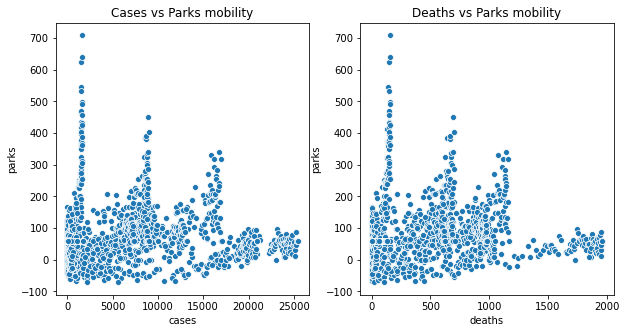

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns
f, ax = plt.subplots(1,2, figsize=(10,5))
sns.scatterplot(x="cases", y="parks", data=df, ax=ax[0])
ax[0].set_title('Cases vs Parks mobility')
sns.scatterplot(x="deaths", y="parks", data=df, ax=ax[1])
ax[1].set_title('Deaths vs Parks mobility')
plt.show()

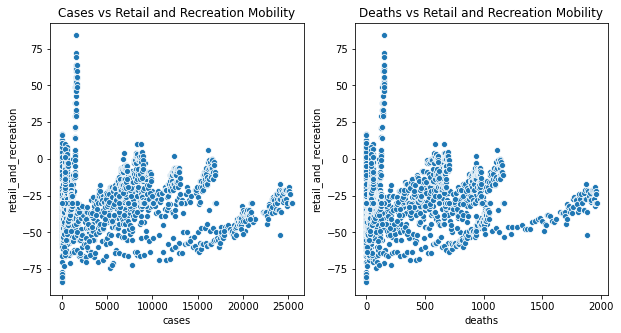

In [17]:
f, ax = plt.subplots(1,2 , figsize=(10,5))
sns.scatterplot(x='cases', y='retail_and_recreation', data=df, ax=ax[0])
ax[0].set_title('Cases vs Retail and Recreation Mobility')
sns.scatterplot(x='deaths', y='retail_and_recreation', data=df, ax=ax[1])
ax[1].set_title('Deaths vs Retail and Recreation Mobility')
plt.show()

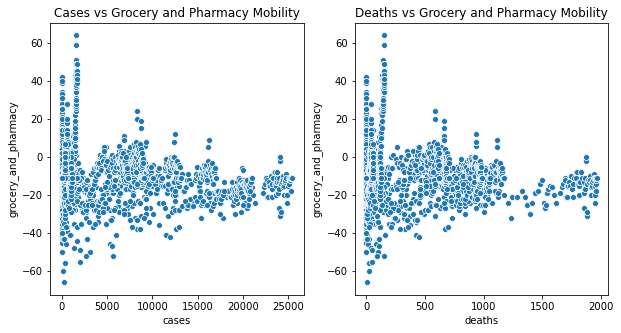

In [18]:
f, ax = plt.subplots(1,2 , figsize=(10,5))
sns.scatterplot(x='cases', y='grocery_and_pharmacy', data=df, ax=ax[0])
ax[0].set_title('Cases vs Grocery and Pharmacy Mobility')
sns.scatterplot(x='deaths', y='grocery_and_pharmacy', data=df, ax=ax[1])
ax[1].set_title('Deaths vs Grocery and Pharmacy Mobility')
plt.show()

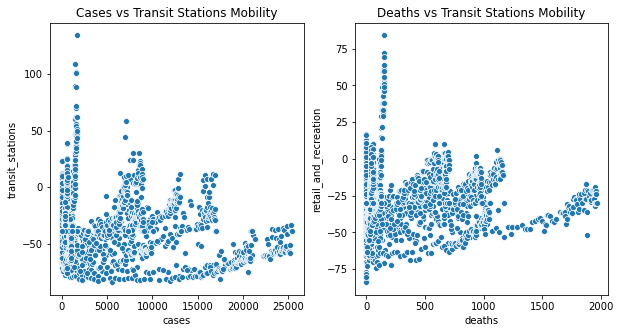

In [19]:
f, ax = plt.subplots(1,2 , figsize=(10,5))
sns.scatterplot(x='cases', y='transit_stations', data=df, ax=ax[0])
ax[0].set_title('Cases vs Transit Stations Mobility')
sns.scatterplot(x='deaths', y='retail_and_recreation', data=df, ax=ax[1])
ax[1].set_title('Deaths vs Transit Stations Mobility')
plt.show()

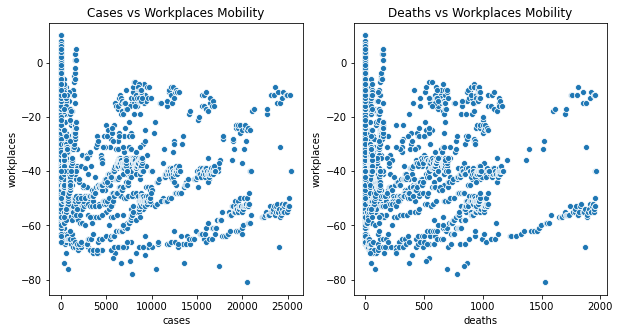

In [20]:
f, ax = plt.subplots(1,2 , figsize=(10,5))
sns.scatterplot(x='cases', y='workplaces', data=df, ax=ax[0])
ax[0].set_title('Cases vs Workplaces Mobility')
sns.scatterplot(x='deaths', y='workplaces', data=df, ax=ax[1])
ax[1].set_title('Deaths vs Workplaces Mobility')
plt.show()

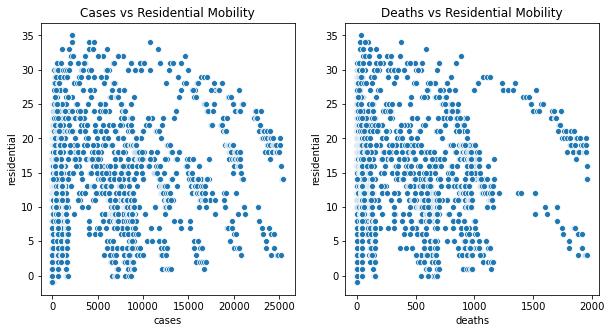

In [21]:
f, ax = plt.subplots(1,2 , figsize=(10,5))
sns.scatterplot(x='cases', y='residential', data=df, ax=ax[0])
ax[0].set_title('Cases vs Residential Mobility')
sns.scatterplot(x='deaths', y='residential', data=df, ax=ax[1])
ax[1].set_title('Deaths vs Residential Mobility')
plt.show()

In [22]:
import plotly.express as px
fig = px.line(df, x='date', y='parks', title='Mobility of Parks')
fig.show("notebook")

In [23]:
import plotly.express as px
fig = px.line(df, x='date', y='retail_and_recreation', title='Retail and Recretion Mobility')
fig.show()

In [24]:
import plotly.express as px
fig = px.line(df, x='date', y='grocery_and_pharmacy', title='Grocery and Pharmacy Mobility')
fig.show()

In [25]:
import plotly.express as px
fig = px.line(df, x='date', y='transit_stations', title='Transit Stations Mobility')
fig.show()

In [26]:
import plotly.express as px
fig = px.line(df, x='date', y='residential', title='Residential Mobility')
fig.show()

Pairs Plot

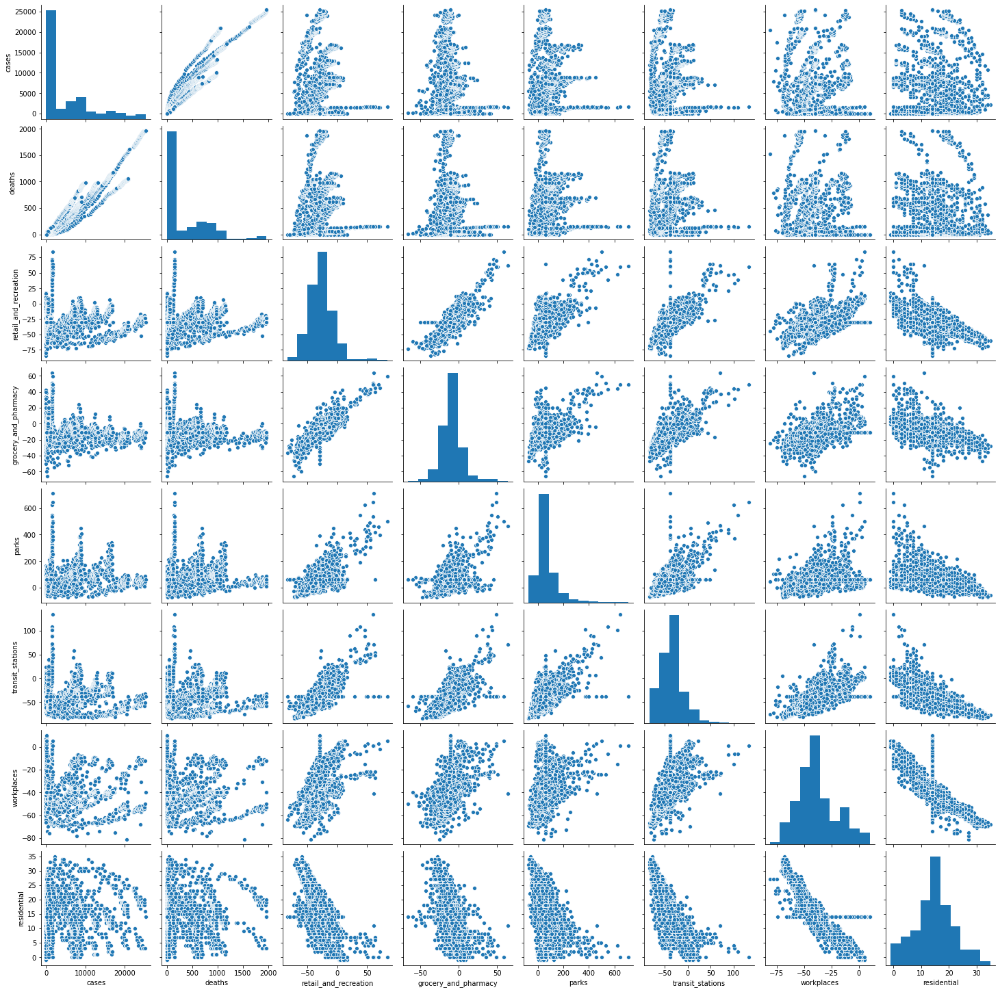

In [27]:
sns.pairplot(df)

In [28]:
df = pd.merge(covid_data, mobility,  how='left', left_on=['date','county'], right_on = ['date','county',])
df = df[df['county']!='Total']
df = df[df['county']!='Unknown']
df


,date,county,cases,deaths,retail_and_recreation,grocery_and_pharmacy,parks,transit_stations,workplaces,residential
0,2020-02-01,Suffolk,1,0,NaN,NaN,NaN,NaN,NaN,NaN
1,2020-02-02,Suffolk,1,0,NaN,NaN,NaN,NaN,NaN,NaN
2,2020-02-03,Suffolk,1,0,NaN,NaN,NaN,NaN,NaN,NaN
3,2020-02-04,Suffolk,1,0,NaN,NaN,NaN,NaN,NaN,NaN
4,2020-02-05,Suffolk,1,0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
2098,2020-07-28,Nantucket,34,1,NaN,NaN,NaN,NaN,NaN,NaN
2099,2020-07-28,Norfolk,10034,977,NaN,NaN,NaN,NaN,NaN,NaN
2100,2020-07-28,Plymouth,9018,706,NaN,NaN,NaN,NaN,NaN,NaN
2101,2020-07-28,Suffolk,20960,1052,NaN,NaN,NaN,NaN,NaN,NaN


In [29]:
df=df.fillna(df.median(axis=0))

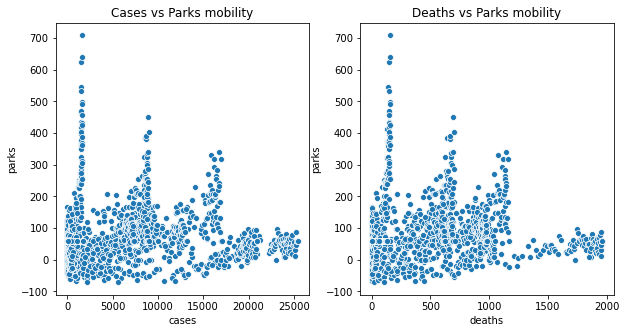

In [30]:
f, ax = plt.subplots(1,2, figsize=(10,5))
sns.scatterplot(x="cases", y="parks", data=df, ax=ax[0])
ax[0].set_title('Cases vs Parks mobility')
sns.scatterplot(x="deaths", y="parks", data=df, ax=ax[1])
ax[1].set_title('Deaths vs Parks mobility')
plt.show()

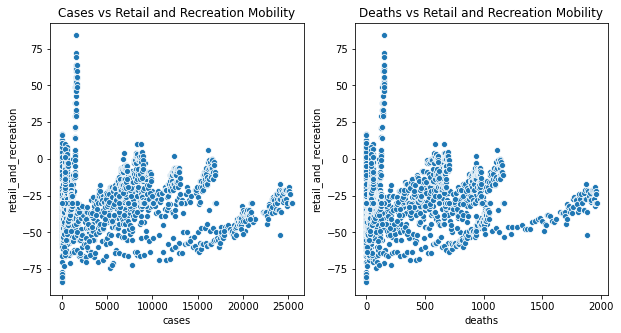

In [31]:
f, ax = plt.subplots(1,2 , figsize=(10,5))
sns.scatterplot(x='cases', y='retail_and_recreation', data=df, ax=ax[0])
ax[0].set_title('Cases vs Retail and Recreation Mobility')
sns.scatterplot(x='deaths', y='retail_and_recreation', data=df, ax=ax[1])
ax[1].set_title('Deaths vs Retail and Recreation Mobility')
plt.show()

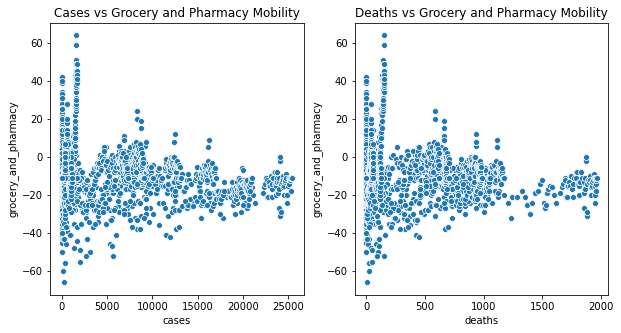

In [32]:
f, ax = plt.subplots(1,2 , figsize=(10,5))
sns.scatterplot(x='cases', y='grocery_and_pharmacy', data=df, ax=ax[0])
ax[0].set_title('Cases vs Grocery and Pharmacy Mobility')
sns.scatterplot(x='deaths', y='grocery_and_pharmacy', data=df, ax=ax[1])
ax[1].set_title('Deaths vs Grocery and Pharmacy Mobility')
plt.show()

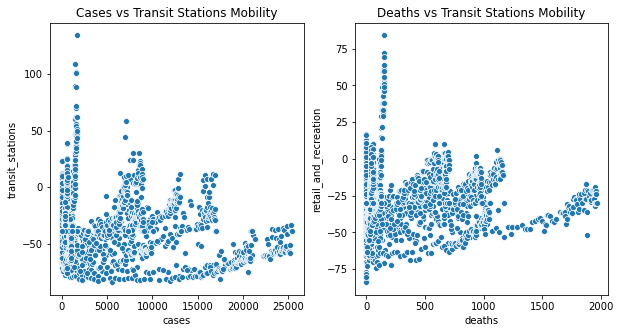

In [33]:
f, ax = plt.subplots(1,2 , figsize=(10,5))
sns.scatterplot(x='cases', y='transit_stations', data=df, ax=ax[0])
ax[0].set_title('Cases vs Transit Stations Mobility')
sns.scatterplot(x='deaths', y='retail_and_recreation', data=df, ax=ax[1])
ax[1].set_title('Deaths vs Transit Stations Mobility')
plt.show()

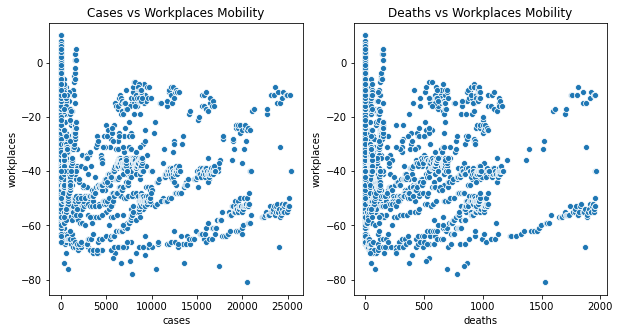

In [34]:
f, ax = plt.subplots(1,2 , figsize=(10,5))
sns.scatterplot(x='cases', y='workplaces', data=df, ax=ax[0])
ax[0].set_title('Cases vs Workplaces Mobility')
sns.scatterplot(x='deaths', y='workplaces', data=df, ax=ax[1])
ax[1].set_title('Deaths vs Workplaces Mobility')
plt.show()

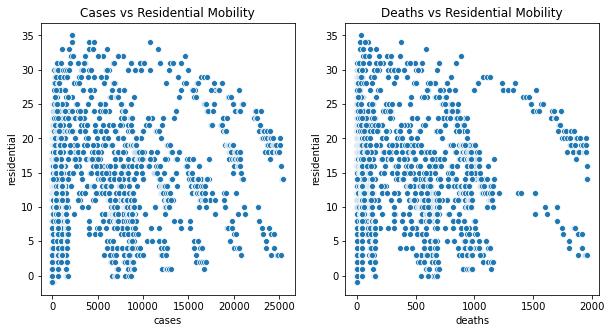

In [35]:
f, ax = plt.subplots(1,2 , figsize=(10,5))
sns.scatterplot(x='cases', y='residential', data=df, ax=ax[0])
ax[0].set_title('Cases vs Residential Mobility')
sns.scatterplot(x='deaths', y='residential', data=df, ax=ax[1])
ax[1].set_title('Deaths vs Residential Mobility')
plt.show()

In [36]:
import plotly.express as px
fig = px.line(df, x='date', y='parks', title='Mobility of Parks')
fig.show()

In [37]:
import plotly.express as px
fig = px.line(df, x='date', y='retail_and_recreation', title='Retail and Recretion Mobility')
fig.show()

In [38]:
import plotly.express as px
fig = px.line(df, x='date', y='grocery_and_pharmacy', title='Grocery and Pharmacy Mobility')
fig.show()

In [39]:
import plotly.express as px
fig = px.line(df, x='date', y='transit_stations', title='Transit Stations Mobility')
fig.show()

In [40]:
import plotly.express as px
fig = px.line(df, x='date', y='residential', title='Residential Mobility')
fig.show()

Pairs Plot

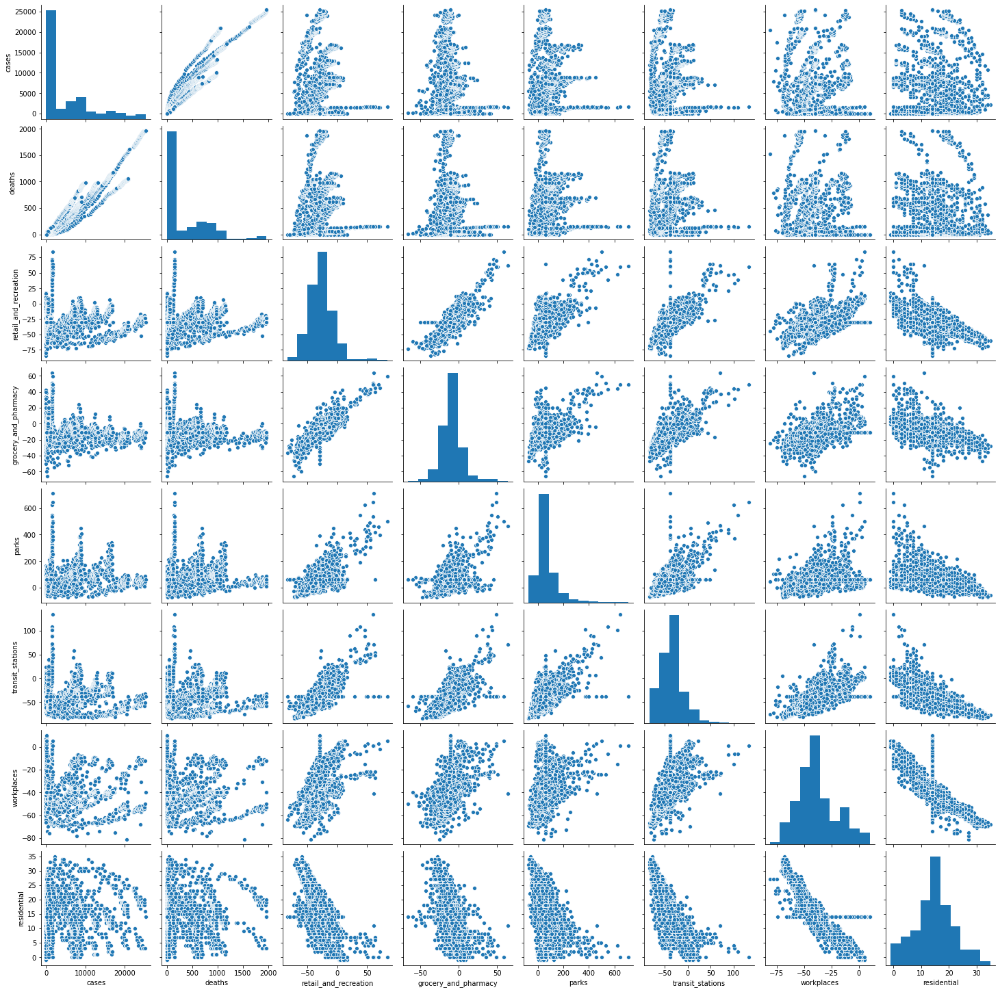

In [41]:
sns.pairplot(df)

In [42]:
dt

,Unnamed: 0,county,new_positives,cumulative_number_of_positives,total_number_of_tests_performed,cumulative_number_of_tests_performed,date,retail_and_recreation,grocery_and_pharmacy,parks,transit_stations,workplaces,residential
0,0,Albany,0,0,0,0,2020-03-02,11.0,15.0,29.0,5.0,3.0,0.0
1,1,Albany,0,0,0,0,2020-03-03,8.0,15.0,41.0,8.0,3.0,-1.0
2,2,Albany,0,0,0,0,2020-03-04,7.0,8.0,6.0,2.0,3.0,0.0
3,3,Albany,0,0,3,3,2020-03-05,5.0,13.0,18.0,2.0,3.0,-1.0
4,4,Albany,0,0,0,3,2020-03-06,6.0,10.0,12.0,7.0,3.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8609,9230,Yates,0,51,53,4905,2020-07-21,NaN,39.0,NaN,NaN,-24.0,NaN
8610,9231,Yates,0,51,115,5020,2020-07-22,NaN,NaN,NaN,NaN,-22.0,NaN
8611,9232,Yates,0,51,41,5061,2020-07-23,NaN,40.0,NaN,NaN,-24.0,NaN
8612,9233,Yates,0,51,79,5140,2020-07-24,NaN,39.0,NaN,NaN,-24.0,NaN


In [44]:

dt = pd.read_csv('data.csv')
dt = dt.drop(['Unnamed: 0'],axis=1)

In [45]:
restaurants = pd.read_csv('restaurant.csv')
restaurants= restaurants.drop(['Unnamed: 0','Unnamed: 0.1','state','region_type','region','country'],axis=1)
# restaurants

In [47]:
import plotly.express as px
import scipy
from scipy.signal import savgol_filter

df_no_na = dt[dt['parks'].notna()]
df_no_na = df_no_na.groupby('date')['parks'].sum().to_frame().reset_index()

fig = px.line(x=df_no_na['date'],
              y=savgol_filter(df_no_na['parks'],33,3),
              title='Mobility of Parks')
fig.show()

In [48]:
dt['retail_and_recreation'].uni

,county,new_positives,cumulative_number_of_positives,total_number_of_tests_performed,cumulative_number_of_tests_performed,date,retail_and_recreation,grocery_and_pharmacy,parks,transit_stations,workplaces,residential
0,Albany,0,0,0,0,2020-03-02,11.0,15.0,29.0,5.0,3.0,0.0
1,Albany,0,0,0,0,2020-03-03,8.0,15.0,41.0,8.0,3.0,-1.0
2,Albany,0,0,0,0,2020-03-04,7.0,8.0,6.0,2.0,3.0,0.0
3,Albany,0,0,3,3,2020-03-05,5.0,13.0,18.0,2.0,3.0,-1.0
4,Albany,0,0,0,3,2020-03-06,6.0,10.0,12.0,7.0,3.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
8609,Yates,0,51,53,4905,2020-07-21,NaN,39.0,NaN,NaN,-24.0,NaN
8610,Yates,0,51,115,5020,2020-07-22,NaN,NaN,NaN,NaN,-22.0,NaN
8611,Yates,0,51,41,5061,2020-07-23,NaN,40.0,NaN,NaN,-24.0,NaN
8612,Yates,0,51,79,5140,2020-07-24,NaN,39.0,NaN,NaN,-24.0,NaN


In [49]:
df_no_na = dt[dt['retail_and_recreation'].notna()]
df_no_na = df_no_na.groupby('date')['retail_and_recreation'].sum().to_frame().reset_index()

fig = px.line(x=df_no_na['date'],
              y=savgol_filter(df_no_na['retail_and_recreation'],33,3),
              title='Retail and Recretion Mobility')
fig.show()

In [56]:
df_no_na = dt[dt['grocery_and_pharmacy'].notna()]
df_no_na = df_no_na.groupby('date')['grocery_and_pharmacy'].sum().to_frame().reset_index()

fig = px.line(x=df_no_na['date'],
              y=savgol_filter(df_no_na['grocery_and_pharmacy'],33,3),
              title='Grocery and Pharmacy Mobility')
fig.show()

In [58]:
df_no_na.groupby('date')['grocery_and_pharmacy'].sum().to_frame().reset_index()

,date,grocery_and_pharmacy
0,2020-03-02,498.0
1,2020-03-03,527.0
2,2020-03-04,348.0
3,2020-03-05,547.0
4,2020-03-06,20.0
...,...,...
141,2020-07-21,393.0
142,2020-07-22,336.0
143,2020-07-23,534.0
144,2020-07-24,403.0


In [59]:
df_no_na = dt[dt['transit_stations'].notna()]
df_no_na = df_no_na.groupby('date')['transit_stations'].sum().to_frame().reset_index()

fig = px.line(x=df_no_na['date'],
              y=savgol_filter(df_no_na['transit_stations'],33,3),
              title='Transit Stations Mobility')
fig.show()

In [61]:
df_no_na = dt[dt['residential'].notna()]
df_no_na = df_no_na.groupby('date')['residential'].sum().to_frame().reset_index()

fig = px.line(x=df_no_na['date'],
              y=savgol_filter(df_no_na['residential'],33,3),
              title='Residential Mobility')
fig.show()